# Introduction

As we have considered in the experiment <a href='exp-HistogramMatching.ipynb'>`exp-HistogramMatching`</a>, the default feature detection is biased.

We know the relative position of image pieces and we can use this information to improve the performance of key detection and matching. In this experiment, we test how to use rough location in key detection.

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
import os
import cv2 as cv
import numpy as np
import math
import matplotlib.pyplot as plt
import copy
import time

from libpano import Config
from libpano import Preprocess
from libpano.ImageCropper import ImageCropper
from libpano.ImageFrame import ImageFrame
from libpano.Stitcher import Stitcher
from libpano.FocalCalculator import FocalCalculator
from libpano.MetaData import MetaData


In [3]:
image_id = 'recent-04'
folder = '../images/' + image_id

meta = MetaData(folder)
df = meta.grid_data
metrics = meta.metrics
print(metrics)


Camera Metrics:
	Focal Length: 4.4589 mm
	Focal Length: 1588.26 px
	Sensor Size: 4.2447996 x 5.6447997 mm
	Pixels per mm: 356.20 x 357.14 px
PanoramaMetrics:
	Frame Count: 15 x 5
	Frame Size: 1512px x 2016px
	Interval Angle: 24.0︒ x 36.0︒
	AoV: 50.9081︒ x 64.6661︒
	AoV: 0.8885 x 1.1286
	PPR: 1701.7168px x 1786.2268px
	Panorama Size: 10692.2019px x 5611.5971px



# Other than White Wall

"White wall" problem, in which there is not enough key features in the frame, is one of the main problem in key detection and matching.

But except the `White Wall`, there are other problems in key detection and matching. In below, I will show the problem, which I named `Biased Keys`.

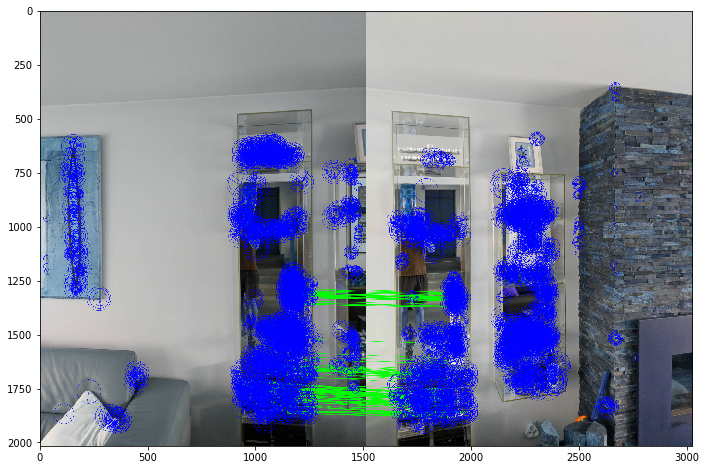

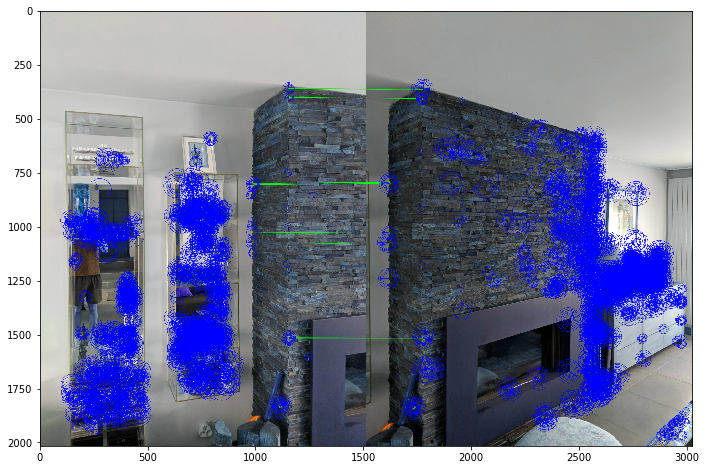

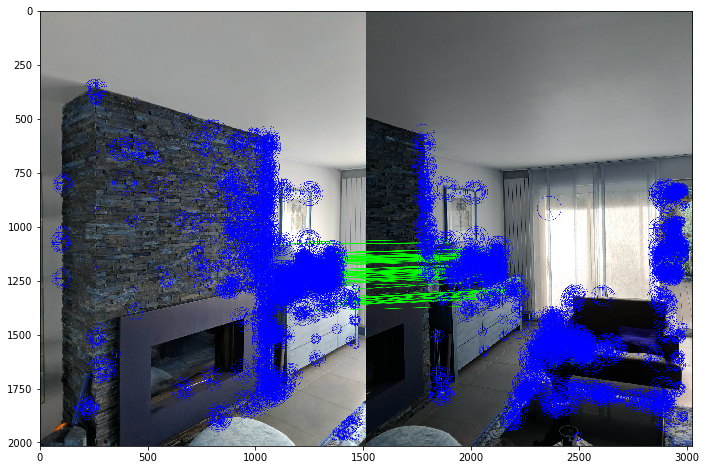

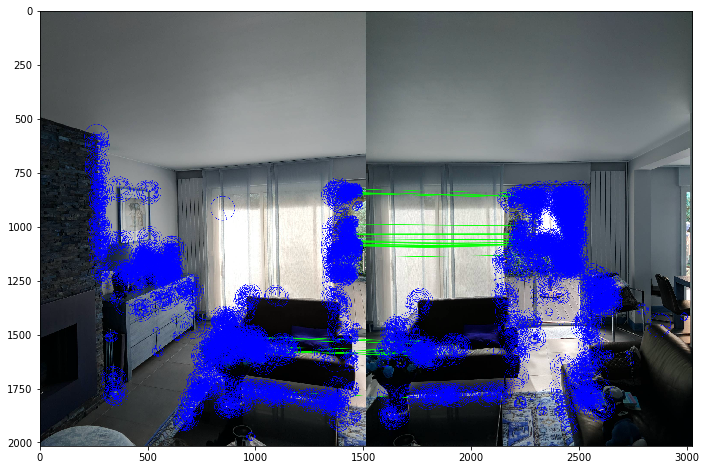

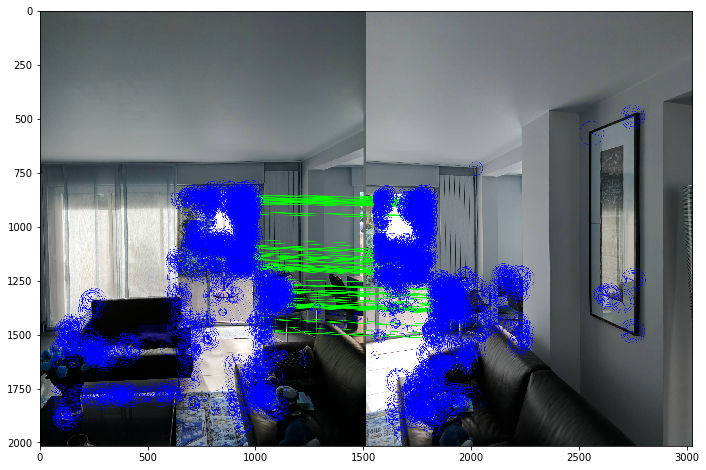

...

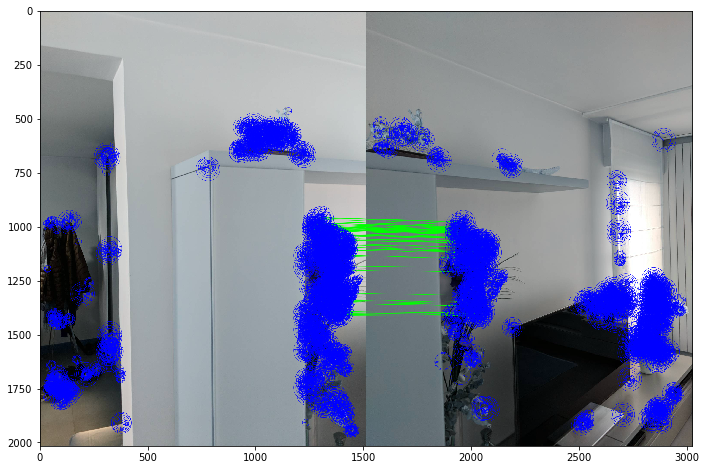

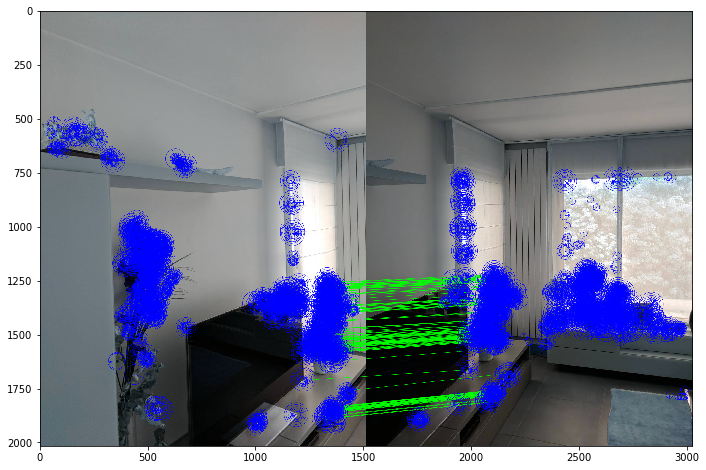

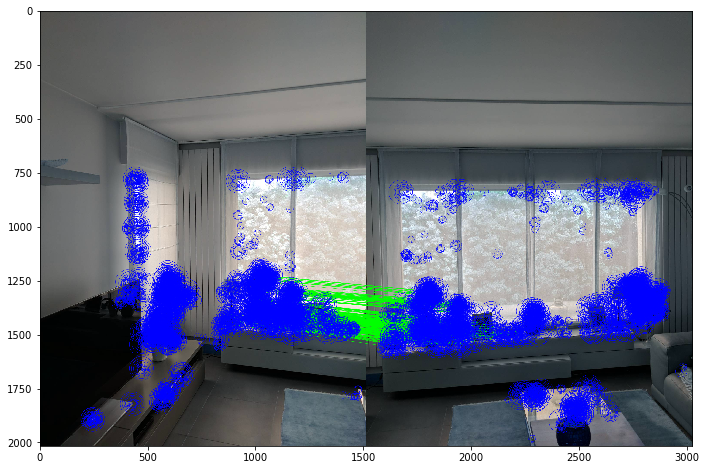

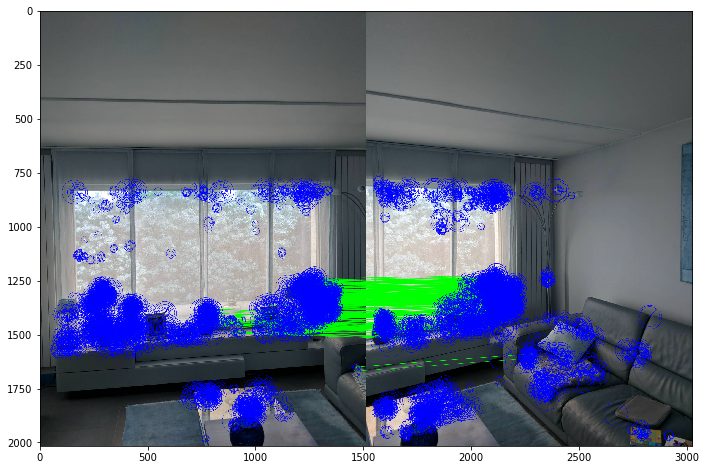

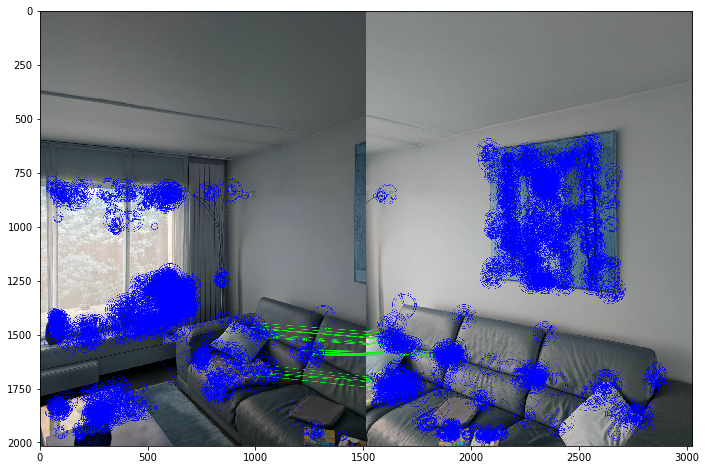

In [13]:
row = 2
uris = df[df.row == row].uri.values.tolist()
pitches = df[df.row == row].pitch.values.tolist()
yaws = df[df.row == row].yaw.values.tolist()
roll = df[df.row == row].roll.values.tolist()

image_names = []
images = []
features = []
finder = cv.ORB_create(nfeatures=4000)
for uri in uris:
    img_name = os.path.join(folder, uri)
    image_names.append(img_name)

    img = cv.imread(img_name)
    images.append(img)

    feature = cv.detail.computeImageFeatures2(finder, img) # cv.cvtColor(img, cv.COLOR_BGR2GRAY))
    features.append(feature)
    
matcher = cv.detail.BestOf2NearestMatcher_create(False, 0.3)
matches = matcher.apply2(features)

bad_matches = []

for idx, match_info in enumerate(matches):
    start = time.perf_counter()
    
    src_idx = match_info.src_img_idx
    dst_idx = match_info.dst_img_idx

    if src_idx + 1 != dst_idx:
        continue
        
    matches_list = match_info.getMatches()
    matches_mask = match_info.getInliers().ravel().tolist()
    draw_params = dict(matchesMask=matches_mask,
                       singlePointColor=None,
                       matchColor=(0, 255, 0),
                       flags=2)
    res = cv.drawMatches(images[src_idx], 
                         features[src_idx].getKeypoints(),
                         images[dst_idx], 
                         features[dst_idx].getKeypoints(),
                         matches_list, None, **draw_params)
    # draw key points
    res = cv.drawKeypoints(res, features[src_idx].getKeypoints(), outImage=None, color=(0, 0, 255), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    right_keypoints = features[dst_idx].getKeypoints()
    width = images[src_idx].shape[1]
    for kp in right_keypoints:
        kp.pt = (kp.pt[0] + width, kp.pt[1])
    res = cv.drawKeypoints(res, right_keypoints, outImage=None, color=(0, 0, 255), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    
    plt.figure(figsize=(12, 8))
    plt.imshow(res)
    plt.show()


##### Those three bad matches due to the left-biased key points.

# Unbiased Feature Detection

In [9]:
def unbiased_match(uris):
    image_names = []
    images = []

    kps = []
    descs = []

    finder = cv.ORB_create(nfeatures=4000)

    for idx, uri in enumerate(uris):
        img_name = os.path.join(folder, uri)
        image_names.append(img_name)

        img = cv.imread(img_name)
        images.append(img)

        x1 = int(img.shape[1] * 0.4)  # 40% point
        x2 = int(img.shape[1] * 0.6)  # 60% point

        img_temp = copy.deepcopy(img)

        if idx % 2 == 0:
            img_temp[:, :x2, :] = 0
        else:
            img_temp[:, x1:, :] = 0
        
        feature = cv.detail.computeImageFeatures2(finder, img_temp)
        kps.append(feature.getKeypoints())
        print('{} keypoints has found.'.format(len(feature.getKeypoints())))
        descs.append(feature.descriptors.get())

    matcher = cv.BFMatcher()
    raw_matches = matcher.knnMatch(descs[0], descs[1], k=2)
    good_points = []
    good_matches=[]
    
    threshold = 0.2
    
    while True:
        good_points = []
        good_matches=[]
        for m1, m2 in raw_matches:
            if m1.distance < threshold * m2.distance:
                good_points.append((m1.trainIdx, m1.queryIdx))
                good_matches.append([m1])
        
        if len(good_matches) >= 7:
            break
            
        threshold += 0.05

    print(threshold)
    
    img3 = cv.drawMatchesKnn(images[0], kps[0], images[1], kps[1], good_matches, None, flags=4)        

    plt.figure(figsize=(12,8))
    plt.imshow(img3)
    plt.show()    

4000 keypoints has found.
4000 keypoints has found.
0.35


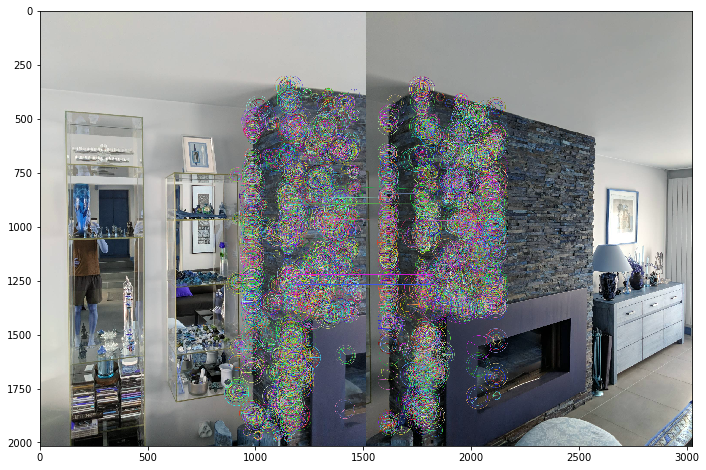

In [10]:
unbiased_match(df[(df.row == row) & ((df.col == 1) | (df.col == 2))].uri.values.tolist())

1149 keypoints has found.
1385 keypoints has found.
0.65


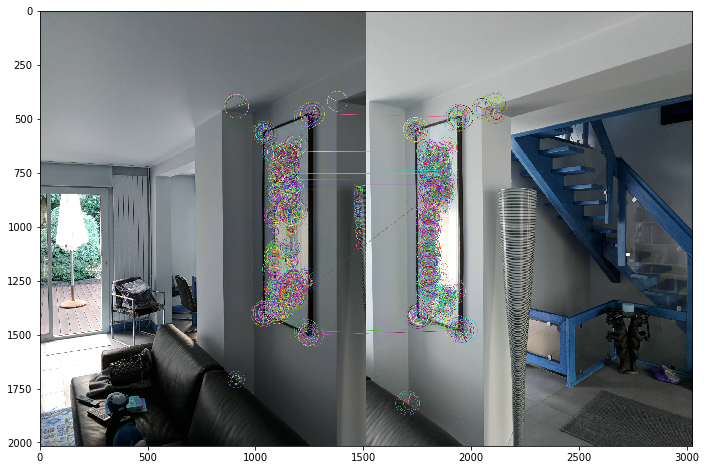

In [11]:
unbiased_match(df[(df.row == row) & ((df.col == 5) | (df.col == 6))].uri.values.tolist())

937 keypoints has found.
1871 keypoints has found.
0.5499999999999999


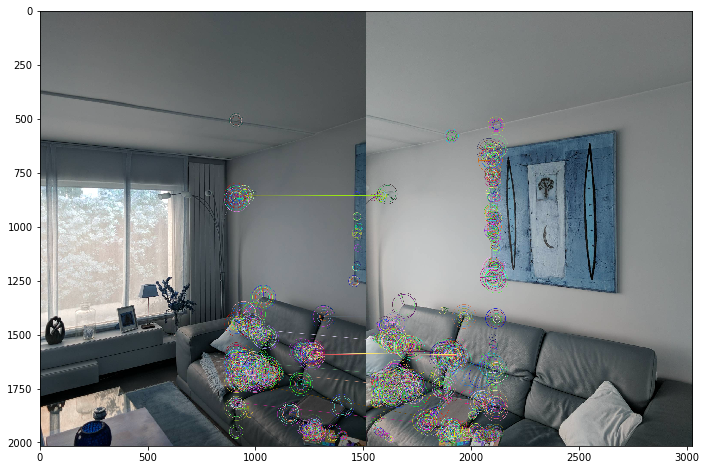

In [12]:
unbiased_match(df[(df.row == row) & ((df.col == 13) | (df.col == 14))].uri.values.tolist())

### Good. Ten features were found for every pairs. And this approach has advantages as following:
##### 1. Matching performance
As we have seen in the examples, this approach can improve the performance of finding match points. It's not enought but `BETTER THAN NOTHING`!
##### 2. Fast feature detection
We search key points only in 40% area of the image and it makes the speed faster. NOTE: it is an advantage when two images were matched, but we should calculate at least 4 feature sets(top, bottom, left, and right).
##### 3. Fast matching
In precedent approaches, all possible images pairs are matched, so it takes O(n^2). But this method takes only O(4n). When we consider that we have about 80 images, matching speed is 20 times faster.

# Order of stitching
The main area of panorama contains the three middle rows. So we decided to stitch image pieces in the following order:

  10 <---------------------------   |    -----------------------------> 9 
  
   6  <-----------------------------   |    -----------------------------> 5
   
   2  <------------------------ CENTER ----------------------> 1
   
   4  <-----------------------------   |    -----------------------------> 3
   
   8  <-----------------------------   |    -----------------------------> 7


row = 2
uris = df[df.row == row].uri.values.tolist()
pitches = df[df.row == row].pitch.values.tolist()
yaws = df[df.row == row].yaw.values.tolist()
roll = df[df.row == row].roll.values.tolist()

# Step 1

In [155]:
center_row = df.row.nunique() // 2
center_col = df.col.nunique() // 2
print(center_row, center_col)

2 7


In [191]:
def get_image_frame(row, col):
    record = df[(df.row == row) & (df.col == col)]

    fn = record.uri.values[0]
    roll = record.roll.values[0]
    pitch = record.pitch.values[0]
    yaw = record.yaw.values[0]
    
    fpath = os.path.join(folder, fn)
    print(fpath)
    
    return ImageFrame(fpath, pitch, yaw, roll)
    

In [254]:
def is_outlier(points, thresh=3.5):
    if len(points.shape) == 1:
        points = points[:, None]
        
    median = np.median(points, axis=0)
    diff = np.sum((points - median)**2, axis=-1)
    diff = np.sqrt(diff)
    med_abs_deviation = np.median(diff)

    modified_z_score = 0.6745 * diff / med_abs_deviation

    return modified_z_score > thresh

In [301]:
def get_distance_horiz(left, right):
    img_width = metrics.FW
    
    x1 = int(img_width * 0.4)  # 40% point
    x2 = int(img_width * 0.6)  # 60% point

    features = []
    
    left_img = copy.deepcopy(left.contents)
    left_img[:, :x2, :] = 0
    feature = cv.detail.computeImageFeatures2(finder, left_img)
    features.append(feature)
    
    right_img = copy.deepcopy(right.contents)
    right_img[:, x1:, :] = 0
    feature = cv.detail.computeImageFeatures2(finder, right_img)
    features.append(feature)

    matcher = cv.detail.BestOf2NearestMatcher_create(False, 0.3)
    matches = matcher.apply2(features)
    
    for idx, match_info in enumerate(matches):
        start = time.perf_counter()

        src_idx = match_info.src_img_idx
        dst_idx = match_info.dst_img_idx

        if src_idx + 1 != dst_idx:
            continue

        # get inlier matches list
        matches_list = match_info.getMatches()
        matches_mask = match_info.getInliers().ravel().tolist()
        
        good_matches = [match for match, mask in zip(matches_list, matches_mask) if mask]
        good_matches = sorted(good_matches, key=lambda m: m.distance, reverse=False)
        good_matches = good_matches[:len(good_matches)//2]
        
        print([m.distance for m in good_matches])

        # get vertical, horizontal, and Euclidean distances
        kps1 = features[0].getKeypoints()
        kps2 = features[1].getKeypoints()
        
        vert_dists = [abs(kps1[m.trainIdx].pt[1] - kps2[m.queryIdx].pt[1]) for m in good_matches]
        horz_dists = [kps2[m.trainIdx].pt[0] + img_width - kps1[m.queryIdx].pt[0] for m in good_matches]
        eucl_dists = [math.sqrt(v**2 + h**2) for v, h in zip(vert_dists, horz_dists)]
        
        print(vert_dists)
        print(horz_dists)
        print(eucl_dists)

        outlier_flags = is_outlier(np.array(vert_dists)) * is_outlier(np.array(horz_dists)) * is_outlier(np.array(eucl_dists))
        print(outlier_flags)
        
        inlier_horz_dists = [horz for horz, outlier in zip(horz_dists, outlier_flags) if not outlier]
        
        print(len(inlier_horz_dists), np.mean(inlier_horz_dists))
        
        draw_params = dict(matchesMask=matches_mask,
                           singlePointColor=None,
                           matchColor=(0, 255, 0),
                           flags=2)
        res = cv.drawMatches(left.contents, 
                             features[src_idx].getKeypoints(),
                             right.contents, 
                             features[dst_idx].getKeypoints(),
                             matches_list, None, **draw_params)
        # draw key points
        res = cv.drawKeypoints(res, features[src_idx].getKeypoints(), outImage=None, color=(0, 0, 255), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        right_keypoints = features[dst_idx].getKeypoints()
        for kp in right_keypoints:
            kp.pt = (kp.pt[0] + width, kp.pt[1])
        res = cv.drawKeypoints(res, right_keypoints, outImage=None, color=(0, 0, 255), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

        plt.figure(figsize=(30, 20))
        plt.imshow(res)
        plt.title('match count={}'.format(np.sum(matches_mask)))
        plt.show()

        return len(inlier_horz_dists), np.mean(inlier_horz_dists)
        

../images/recent-04/img-r1-335.jpg
../images/recent-04/img-r1-000.jpg
[10.0, 13.0, 14.0, 19.0]
[1001.0399780273438, 1146.2400512695312, 127.296142578125, 121.0755615234375]
[986.8800048828125, 986.1119689941406, 987.8399963378906, 988.6694641113281]
[1405.707359889136, 1512.0459882317994, 996.0081155694035, 996.0555209748081]
[False False False False]
4 987.375358581543


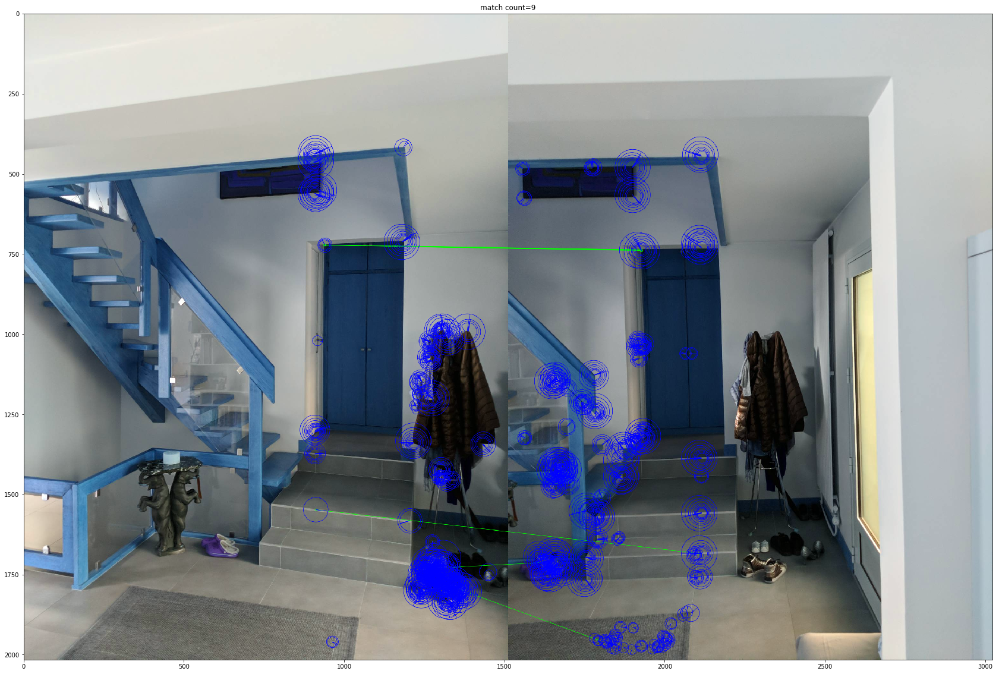

(4, 987.375358581543)

In [302]:
left = get_image_frame(2, 7)
left.load_image()

right = get_image_frame(2, 8)
right.load_image()

get_distance_horiz(left, right)

In [257]:
matches_mask

[1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]

In [203]:
[match for match, mask in zip(matches_list, matches_mask) if mask]

[<DMatch 0x7f713c232810>,
 <DMatch 0x7f713cf140d0>,
 <DMatch 0x7f713cf145f0>,
 <DMatch 0x7f713cf14d10>]

In [204]:
matches_list

[<DMatch 0x7f713c232810>,
 <DMatch 0x7f713c232390>,
 <DMatch 0x7f713c397910>,
 <DMatch 0x7f713c1297b0>,
 <DMatch 0x7f713cf140d0>,
 <DMatch 0x7f713cf14130>,
 <DMatch 0x7f713cf145f0>,
 <DMatch 0x7f713cf14f70>,
 <DMatch 0x7f713cf14eb0>,
 <DMatch 0x7f713cf14fb0>,
 <DMatch 0x7f713cf14d10>,
 <DMatch 0x7f713cf14f90>,
 <DMatch 0x7f713cf14fd0>,
 <DMatch 0x7f713cf14f50>,
 <DMatch 0x7f713c3c68b0>]

In [198]:
good_matches = [matches_list[idx] if matches_mask[idx] == 1 for idx in range(len(matches_mask))]
good_matches

SyntaxError: invalid syntax (<ipython-input-198-45fda2727b7b>, line 1)

../images/recent-04/img-r1-335.jpg
../images/recent-04/img-r1-000.jpg


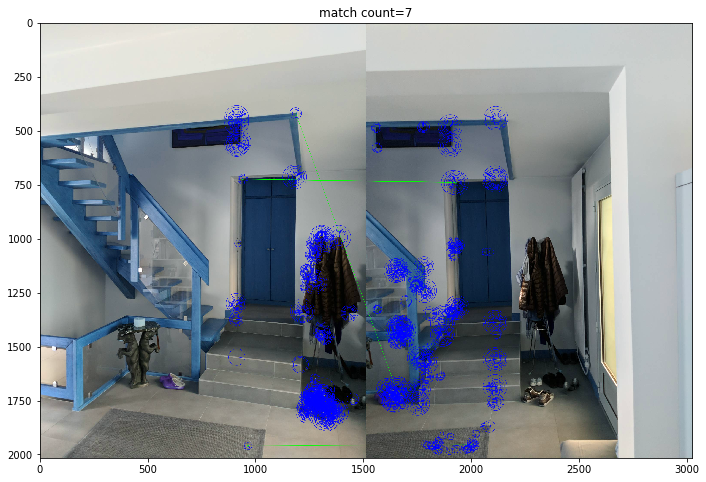

../images/recent-04/img-r1-022.jpg


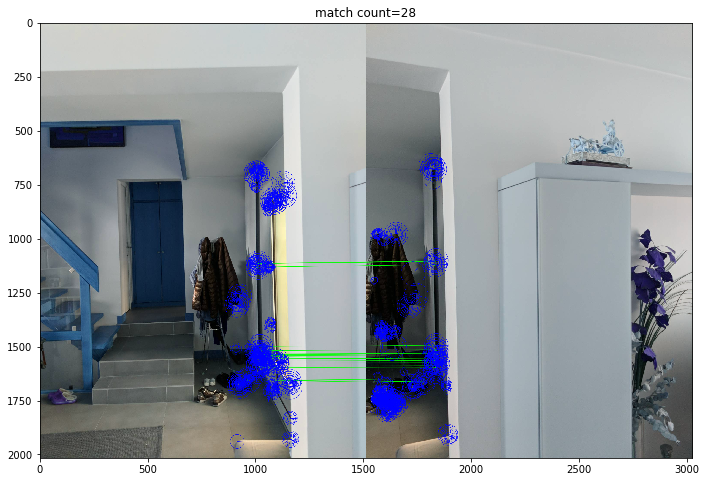

../images/recent-04/img-r1-048.jpg


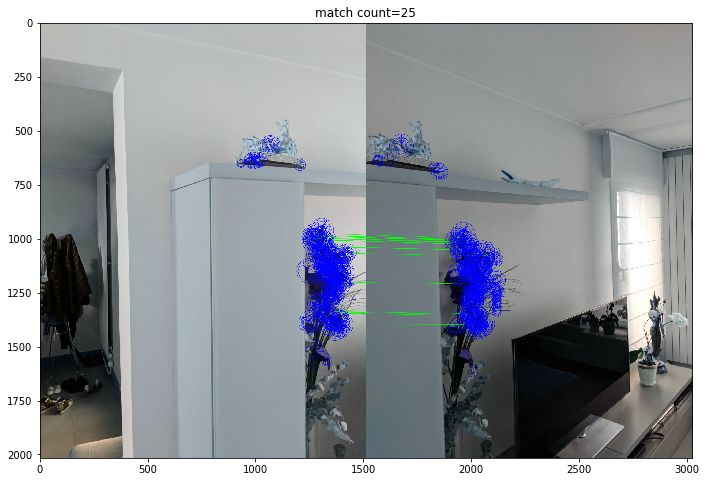

../images/recent-04/img-r1-070.jpg


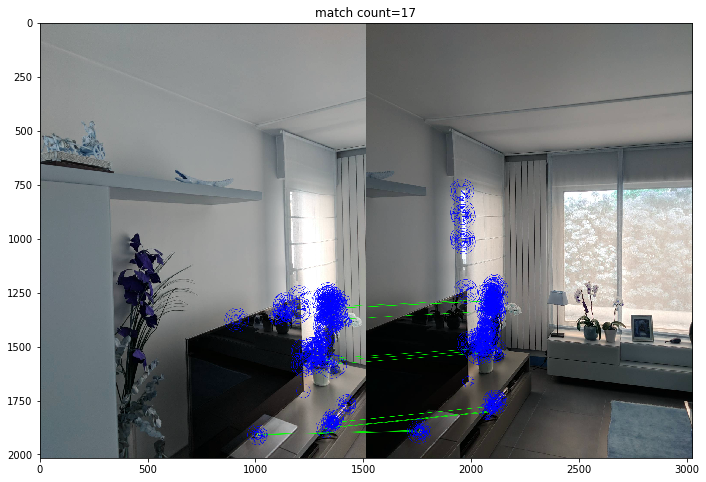

../images/recent-04/img-r1-095.jpg


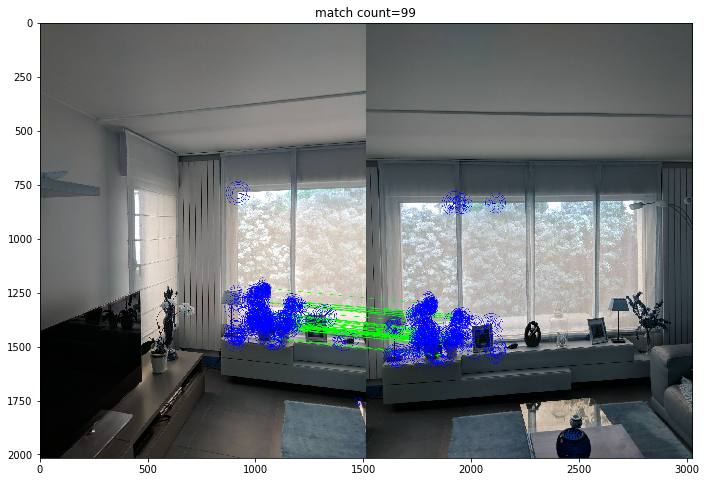

../images/recent-04/img-r1-118.jpg


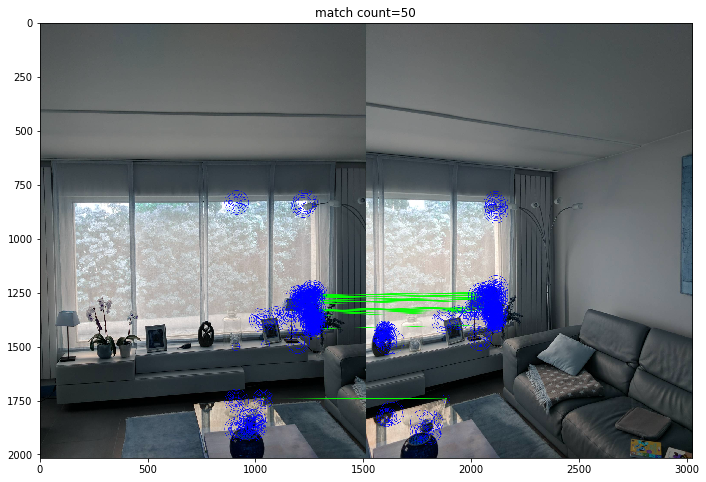

../images/recent-04/img-r1-143.jpg


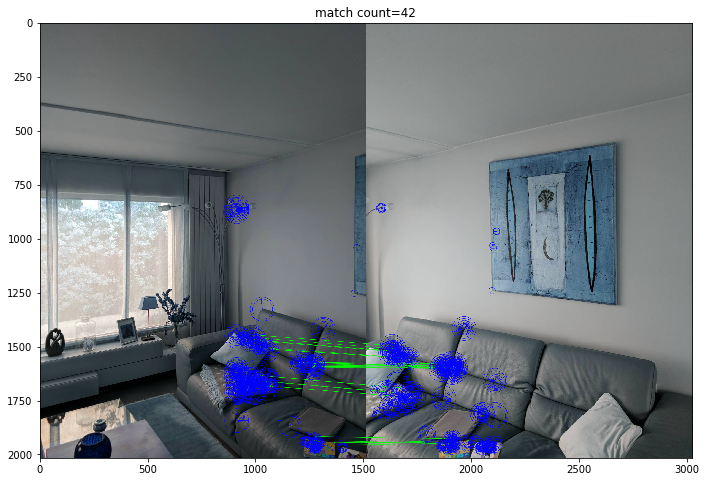

In [179]:
right_image = get_image_frame(center_row, center_col)
right_image.load_image()

for i in range(1, 8):
    left_image = right_image

    right_image = get_image_frame(center_row, center_col + i)
    right_image.load_image()
    
    get_distance_horiz(left_image, right_image)

In [173]:
df[df.row==2]

,row,col,uri,pitch,roll,yaw
30,2,0,img-r1-167.jpg,1.618314,0.672979,17.196747
31,2,1,img-r1-192.jpg,1.405421,-0.227626,41.420685
32,2,2,img-r1-217.jpg,1.407111,1.317603,66.893280
33,2,3,img-r1-240.jpg,1.669483,1.424618,89.764771
34,2,4,img-r1-264.jpg,1.795640,0.912027,113.928802
35,2,5,img-r1-286.jpg,0.791613,0.535418,136.117828
36,2,6,img-r1-310.jpg,1.689086,1.997290,160.312744
37,2,7,img-r1-335.jpg,1.852506,3.240176,185.285416
38,2,8,img-r1-000.jpg,1.814764,1.945364,209.926773
39,2,9,img-r1-022.jpg,1.616959,2.058648,232.099152


In [190]:
def is_outlier(points, thresh=1.2):
    if len(points.shape) == 1:
        points = points[:, None]
        
    median = np.median(points, axis=0)
    diff = np.sum((points - median)**2, axis=-1)
    diff = np.sqrt(diff)
    med_abs_deviation = np.median(diff)

    modified_z_score = 0.6745 * diff / med_abs_deviation

    return modified_z_score > thresh

In [189]:
is_outlier(np.array([150, 50, 23, 28, 15, 17, 38, 16, 25, 17, .5, 10]))

array([ True,  True, False, False, False, False,  True, False, False,
       False,  True,  True])

In [5]:
df[df.row==2]

,row,col,uri,pitch,roll,yaw
30,2,0,img-r1-167.jpg,1.618314,0.672979,17.196747
31,2,1,img-r1-192.jpg,1.405421,-0.227626,41.420685
32,2,2,img-r1-217.jpg,1.407111,1.317603,66.893280
33,2,3,img-r1-240.jpg,1.669483,1.424618,89.764771
34,2,4,img-r1-264.jpg,1.795640,0.912027,113.928802
35,2,5,img-r1-286.jpg,0.791613,0.535418,136.117828
36,2,6,img-r1-310.jpg,1.689086,1.997290,160.312744
37,2,7,img-r1-335.jpg,1.852506,3.240176,185.285416
38,2,8,img-r1-000.jpg,1.814764,1.945364,209.926773
39,2,9,img-r1-022.jpg,1.616959,2.058648,232.099152
